# Notes: 

https://www.analyticsvidhya.com/blog/2018/11/implementation-faster-r-cnn-python-object-detection/
https://towardsdatascience.com/faster-r-cnn-object-detection-implemented-by-keras-for-custom-data-from-googles-open-images-125f62b9141a

https://docs.microsoft.com/en-us/cognitive-toolkit/object-detection-using-fast-r-cnn

https://www.annytab.com/faster-r-cnn-object-detection-in-python/

https://github.com/pytorch/vision/blob/master/torchvision/models/detection/faster_rcnn.py
https://github.com/supernotman/Faster-RCNN-with-torchvision/blob/master/train.py

### Purpose:

To train and view outputs of a object detection model. Specifically identifying Asteroids in a large image.

In [1]:
from PIL import Image
import pandas as pd
from tqdm import tqdm
import numpy as np

import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.models.detection.mask_rcnn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

import matplotlib.pyplot as plt
from matplotlib import patches

if torch.cuda.is_available():
    device = 'cuda:0'
else:
    device = 'cpu'
    
device = torch.device(device)    
cpu_device = torch.device("cpu")

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(num_classes=2)
model =  model.to(device)

# I do not know what this is, but assume that the model has certain optimizer info built in.
params = [p for p in model.parameters() if p.requires_grad]

optimizer = torch.optim.SGD(
    params, lr=0.01, momentum=0.9, weight_decay=1e-4)

# define the torchvision image transforms
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Useful when viewing fullsize images through the VNC
save_dir = "/g/g15/ahlquist/Documents/workspace/output_dir"

# Directory where data is found
data_dir = "/usr/workspace/DSSI_ch/data_and_information"

# Shared folder
team_6_dir = "/usr/workspace/DSSI_ch/team6"
npz_index = 0 

In [ ]:
# Load pretrained model if not wanting to train from scratch
model_pth = "./models/faster_rcnn_trained.pth"
model = torch.load(model_pth)

In [2]:
def get_data():
    
    images = list()
    targets = list()
    
    offset = 20
    
    for i in range(100):
        images.append(transform(Image.open(f"{team_6_dir}/data/astroids_0_{i}.jpg").convert("L")))
        # Put target information into the correct format

        boxes = pd.read_csv(f"{team_6_dir}/data/astroids_0_{i}.csv")
        boxes = boxes.apply(lambda r : np.array((r["xmin"] + offset, r["ymin"] + offset, 
                                                r["xmax"] - offset, r["ymax"] - offset)), axis=1)

        labels = np.ones(len(boxes))
        
        targets.append({"boxes": torch.FloatTensor(boxes),
                   "labels": torch.Tensor(labels).to(torch.int64)})
        
        
    return images, targets

In [3]:
images, targets = get_data()

In [4]:
def train_one_epoch(model, optimizer, images, targets, device):

    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    loss_dict = model(images, targets)

    losses = sum(loss for loss in loss_dict.values())

    optimizer.zero_grad()
    losses.backward()
    optimizer.step()

In [ ]:
# Make array of images into a tensor
Image_torch = torch.zeros(100, 3080,3072)
for i in range(100):
    Image_torch[i] = images[i]
    
model.train()

# Batch Size of 6
BS = 6
for i in tqdm(range(1000)):
    Image_targets = []
    samp = np.random.randint(0, 100,size=(BS))
    for index in samp:
        Image_targets.append(targets[index])
    train_one_epoch(model, optimizer, Image_torch[samp].reshape(BS, 1, 3080,3072), Image_targets, device) 

# Save model to a more temp location
model_pth = "./models/faster_rcnn_trained_1.pth"
torch.save(model, model_pth)

In [6]:
# Choose an image you want to evaluate on
choice = 4

model.eval()
image = images[choice]
output = model(image.unsqueeze(0).to(device))

/g/g15/ahlquist/.conda/envs/ast_ethan_new/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /opt/conda/conda-bld/pytorch_1623448234945/work/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [7]:
output_s = [{k: v.cpu() for k, v in t.items()} for t in output]
print(output_s)

[{'boxes': tensor([[1144.4681, 1210.6089, 1207.7327, 1273.5315],
        [2737.8083, 1308.2438, 2802.2625, 1371.0408],
        [1626.5955, 1495.5138, 1689.4106, 1559.4066],
        [ 893.5788, 1616.3644,  957.0817, 1678.7747],
        [2689.4062,  669.8041, 2751.8606,  733.5211],
        [1685.0345, 2031.8561, 1747.5487, 2094.5771],
        [2215.4700, 1293.0652, 2277.5081, 1354.8514],
        [1967.2444, 2396.8613, 2030.8242, 2458.9148],
        [2620.6250, 2450.3699, 2683.1699, 2513.4917],
        [1413.6968, 1801.3738, 1476.0530, 1862.5548],
        [1145.1147, 2338.8135, 1207.5981, 2400.9453],
        [2616.8730, 2222.1899, 2679.8186, 2284.3430],
        [2961.8303,  747.4278, 3025.2903,  808.7006],
        [2781.7715, 1274.4194, 2844.0950, 1337.4918],
        [ 790.3419, 1923.4320,  852.6622, 1985.7214],
        [ 613.9417, 1548.4243,  676.7401, 1610.0376],
        [2841.0674, 2062.8936, 2903.1304, 2124.8862],
        [ 603.3420, 2002.2688,  666.7406, 2063.9810],
        [1078.141

tensor([[1144.4681, 1210.6089, 1207.7327, 1273.5315],
        [2737.8083, 1308.2438, 2802.2625, 1371.0408],
        [1626.5955, 1495.5138, 1689.4106, 1559.4066],
        [ 893.5788, 1616.3644,  957.0817, 1678.7747],
        [2689.4062,  669.8041, 2751.8606,  733.5211],
        [1685.0345, 2031.8561, 1747.5487, 2094.5771],
        [2215.4700, 1293.0652, 2277.5081, 1354.8514],
        [1967.2444, 2396.8613, 2030.8242, 2458.9148],
        [2620.6250, 2450.3699, 2683.1699, 2513.4917],
        [1413.6968, 1801.3738, 1476.0530, 1862.5548],
        [1145.1147, 2338.8135, 1207.5981, 2400.9453],
        [2616.8730, 2222.1899, 2679.8186, 2284.3430],
        [2961.8303,  747.4278, 3025.2903,  808.7006],
        [2781.7715, 1274.4194, 2844.0950, 1337.4918],
        [ 790.3419, 1923.4320,  852.6622, 1985.7214],
        [ 613.9417, 1548.4243,  676.7401, 1610.0376],
        [2841.0674, 2062.8936, 2903.1304, 2124.8862],
        [ 603.3420, 2002.2688,  666.7406, 2063.9810],
        [1078.1410, 1716.949

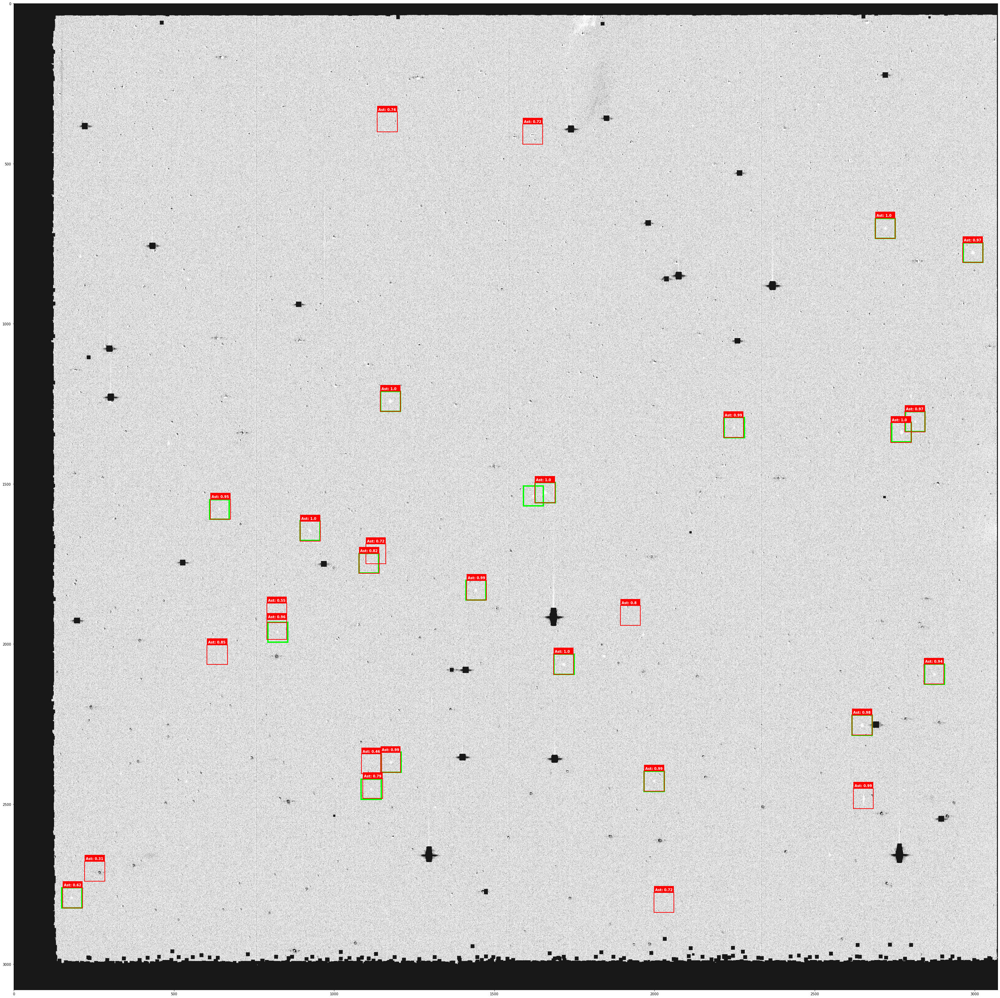

In [22]:
out = output[0]
image = image.squeeze()
fig = plt.figure(figsize=(40, 40))

#add axes to the image
ax = fig.add_axes([0,0,1,1])
plt.imshow(image, cmap="Greys_r")

# Draw ground truth boxes
ground_truth = np.array(targets[choice]["boxes"])
for box in ground_truth:  
    xmin = box[0]
    ymin = box[1]
    xmax = box[2]
    ymax = box[3]
    
    print(xmin)
    
    width = xmax - xmin
    height = ymax - ymin
    
    # assign different color to different classes of objects  
    edgecolor = 'lime'
    ax.annotate('', xy=(xmax-40,ymin+20))
    
    # add bounding boxes to the image
    rect = patches.Rectangle((xmin,ymin), width, height, edgecolor = edgecolor, facecolor = 'none', lw=4)
    ax.add_patch(rect)
    
guesses = out["boxes"].clone().detach().cpu().numpy()
scores = out["scores"].clone().detach().cpu().numpy()

# Draw prediction boxes
for box, score in zip(guesses, scores):  
    xmin = box[0]
    ymin = box[1]
    xmax = box[2]
    ymax = box[3]
    
    width = xmax - xmin
    height = ymax - ymin
    
    if(float(score) > .30):
        # assign different color to different classes of objects  
        edgecolor = 'r'
        ax.annotate(f" Ast: {round(float(score), 2)}", xy=(xmin,ymin-5), color='white', weight='bold')
        rect = patches.Rectangle((xmin,ymin-20), width, 20, edgecolor = "none", facecolor = edgecolor)
        ax.add_patch(rect)

        # add bounding boxes to the image
        rect = patches.Rectangle((xmin,ymin), width, height, edgecolor = edgecolor, facecolor = 'none', lw=2)
        ax.add_patch(rect)

# Save image to personal dir so I can view easyly through VPN
plt.savefig(f"{save_dir}/asteroid_guesses_4", format='png')

In [ ]:
model_pth = "./models/faster_rcnn_trained_1.pth"
torch.save(model, model_pth)

In [5]:
model_pth = "./models/faster_rcnn_trained.pth"
model = torch.load(model_pth)